# Tarea 1. Visualización de Datos en Python y R.
## Jorge Arteaga y Adriana Palacio.
## Maestría en Estadística Aplicada.
### Universidad del Norte.

## Ejercicio 1.1

Trabajaremos con el conjunto de datos de 120 años de historia olímpica adquirido por Randi Griffin en [Randi-Griffin](https://www.sports-reference.com/) y puesto a disposición en [athlete_events](https://raw.githubusercontent.com/lihkirun/AppliedStatisticMS/main/DataVisualizationRPython/Lectures/Python/PythonDataSets/athlete_events.csv). La tarea consiste en identificar los cinco deportes más importantes según el mayor número de medallas otorgadas en el año 2016, y luego realizar el siguiente análisis:

1. Genere un gráfico que indique el número de medallas concedidas en cada uno de los cinco principales deportes en 2016.
2. Trace un gráfico que represente la distribución de la edad de los ganadores de medallas en los cinco principales deportes en 2016.
3. Descubre qué equipos nacionales ganaron el mayor número de medallas en los cinco principales deportes en 2016.
4. Observe la tendencia del peso medio de los atletas masculinos y femeninos ganadores en los cinco principales deportes en 2016

- Pasos principales.

1. Descargue el conjunto de datos y formatéelo como un DataFrame de pandas.
2. Filtra el **DataFrame** para incluir solo las filas correspondientes a los ganadores de medallas de 2016.
3. Descubre las medallas concedidas en 2016 en cada deporte.
4. Enumera los cinco deportes más importantes en función del mayor número de medallas concedidas. Filtra el **DataFrame** una vez más para incluir solo los registros de los cinco deportes principales en 2016.
5. Genere un gráfico de barras con los recuentos de registros correspondientes a cada uno de los cinco deportes principales.
6. Generar un histograma para la característica Edad de todos los ganadores de medallas en los cinco deportes principales (2016).
7. Genera un gráfico de barras que indique cuántas medallas ganó el equipo de cada país en los cinco deportes principales en 2016.
8. Genere un gráfico de barras que indique el peso medio de los jugadores, clasificados en función del género, que ganaron en los cinco principales deportes en 2016.

Primero, cargaremos los modulos que se usarán en todo el taller:

In [1]:
import matplotlib.pyplot as plt
import numpy  as np
import pandas as pd
import seaborn as sns
from datetime import datetime
import plotly.express as px
from plotly.offline import plot as px_off_plot
import altair as alt
alt.renderers.enable('html')
from altair import pipe, limit_rows, to_values
t = lambda data: pipe(data, limit_rows(max_rows=10000), to_values)
alt.data_transformers.register('custom', t)
alt.data_transformers.enable('custom')

DataTransformerRegistry.enable('custom')

Primero, leamos los archivos de la **URL**, y carguemoslos en un **DataFrame** de **pandas**:

In [2]:
athlete_link = "https://raw.githubusercontent.com/lihkirun/AppliedStatisticMS/main/DataVisualizationRPython/Lectures/Python/PythonDataSets/athlete_events.csv"
athlete_df = pd.read_csv(athlete_link)
athlete_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


Filtremos ahora el DataFrame para solo mostrar a los ganadores de Medallas:

In [3]:
#Primero miremos que valores tiene la columna Medal
athlete_df["Medal"].unique()

array([nan, 'Gold', 'Bronze', 'Silver'], dtype=object)

In [4]:
#Filtrando por Ganadores de Medallas y año 2016
athlete_df = athlete_df[athlete_df.Medal.notna() & (athlete_df.Year == 2016)]
athlete_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
158,62,Giovanni Abagnale,M,21.0,198.0,90.0,Italy,ITA,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Men's Coxless Pairs,Bronze
161,65,Patimat Abakarova,F,21.0,165.0,49.0,Azerbaijan,AZE,2016 Summer,2016,Summer,Rio de Janeiro,Taekwondo,Taekwondo Women's Flyweight,Bronze
175,73,Luc Abalo,M,31.0,182.0,86.0,France,FRA,2016 Summer,2016,Summer,Rio de Janeiro,Handball,Handball Men's Handball,Silver
450,250,Saeid Morad Abdevali,M,26.0,170.0,80.0,Iran,IRI,2016 Summer,2016,Summer,Rio de Janeiro,Wrestling,"Wrestling Men's Middleweight, Greco-Roman",Bronze
794,455,Denis Mikhaylovich Ablyazin,M,24.0,161.0,62.0,Russia,RUS,2016 Summer,2016,Summer,Rio de Janeiro,Gymnastics,Gymnastics Men's Team All-Around,Silver


Ahora, revisemos cuales son los deportes con más medallas concedidas:

In [5]:
#Agrupando por deporte, y luego contando el número de medallas concedidas
#Luego, se ordenan entre los deportes que más tienen medallas
important_sport = athlete_df.groupby(["Sport"])["Medal"].count().sort_values(ascending = False).head(5)
important_sport = pd.DataFrame(data=important_sport).reset_index()
important_sport

,Sport,Medal
0,Athletics,192
1,Swimming,191
2,Rowing,144
3,Football,106
4,Hockey,99


Se puede observar que atletismo se lleva el primer lugar con 192 medallas concedidas, luego natación con 191, Remo con 144, Fútbol con 106 y Hockey con 99 medallas. Filtremos entonces el DataFrame únicamente con estos cinco deportes.

In [6]:
#Filtrando por los deportes con más medallas
athlete_df = athlete_df[athlete_df.Sport.isin(["Athletics","Swimming", "Rowing", "Football", "Hockey"])]
athlete_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
158,62,Giovanni Abagnale,M,21.0,198.0,90.0,Italy,ITA,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Men's Coxless Pairs,Bronze
814,465,"Matthew ""Matt"" Abood",M,30.0,197.0,92.0,Australia,AUS,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,Bronze
1228,690,Chantal Achterberg,F,31.0,172.0,72.0,Netherlands,NED,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Quadruple Sculls,Silver
1529,846,Valerie Kasanita Adams-Vili (-Price),F,31.0,193.0,120.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's Shot Put,Silver
1847,1017,Nathan Ghar-Jun Adrian,M,27.0,198.0,100.0,United States,USA,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 50 metres Freestyle,Bronze


Generemos ahora el gráfico que indica el número de medallas concedidas en cada uno de los cinco principales deportes en 2016:

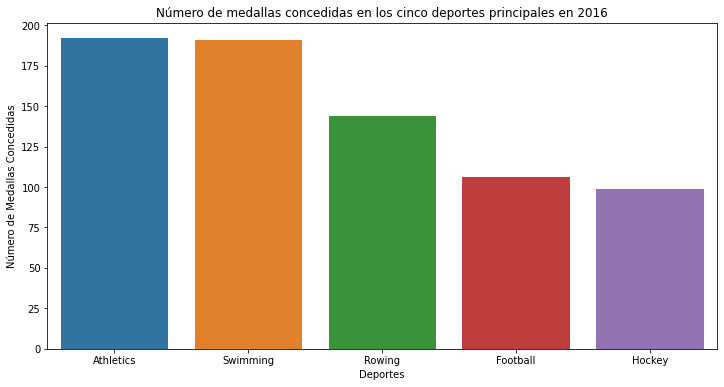

In [7]:
fig, ax1 = plt.subplots(figsize=(12,6))
plt.rcParams.update({'font.size': 10})

sns.barplot(data = important_sport, x="Sport", y="Medal")
ax1.set_xlabel('Deportes')
ax1.set_ylabel('Número de Medallas Concedidas')
ax1.tick_params(axis='y')
ax1.set_title("Número de medallas concedidas en los cinco deportes principales en 2016")
plt.show()

Se observa la gráfica generada con la información de la tabla anteriormente mencionada. Ahora, miremos como se encuentra distribuida la variable edad entre los ganadores de Medallas.

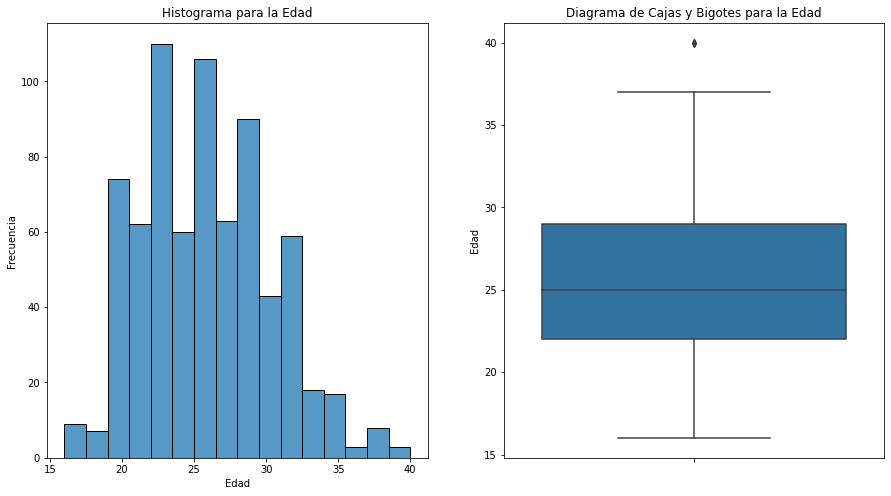

In [8]:
fig, ax=plt.subplots(1,2, figsize=(15,8))

sns.histplot(x="Age", data=athlete_df, ax=ax[0]) #Histograma de la edad con el dataFrame ya filtrado
ax[0].set_xlabel("Edad")
ax[0].set_ylabel("Frecuencia")
ax[0].set_title("Histograma para la Edad")

sns.boxplot(y="Age", data=athlete_df, ax=ax[1])  #Diagrama de cajas y bigotes para el diagrama ya filtrado
ax[1].set_ylabel("Edad")
ax[1].set_title("Diagrama de Cajas y Bigotes para la Edad")

plt.show()

In [9]:
athlete_df.describe()

,ID,Age,Height,Weight,Year
count,732.000000,732.000000,729.000000,727.000000,732.0
mean,68648.244536,25.577869,180.023320,73.720770,2016.0
std,39361.251654,4.451373,10.076398,14.279014,0.0
min,62.000000,16.000000,150.000000,40.000000,2016.0
25%,32676.750000,22.000000,173.000000,64.000000,2016.0
50%,73187.000000,25.000000,180.000000,72.000000,2016.0
75%,103225.000000,29.000000,187.000000,82.000000,2016.0
max,135525.000000,40.000000,207.000000,136.000000,2016.0


Como se puede observar en el histograma y en el diagrama de cajas y bigotes, la mayoría de los ganadores de medallas en 2016 tienen entre 22 y 29 años (primer y tercer cuantil). Esto representa el 50% de la población. La media y la mediana tienen valores similares, y se ubican entre los 25-26 años. Esto se observa en el histograma, donde se puede ver una gráfica algo simétrica. El valor mínimo fue de 16 años, y el valor máximo de 40 años (El cual es un dato extremo). También se observa que el 75% de los ganadores de medallas en los cinco deportes principales, tenían menos de 29 años.

Ahora, miremos cuántas medallas ganó el equipo de cada país en los cinco deportes principales de 2016:

In [10]:
#Agrupando por Equipo, y luego contando el número de medallas concedidas
#Luego, se ordenan entre los equipos que más medallas obtuvieron
team_medal = athlete_df.groupby(["Team"])["Medal"].count().sort_values(ascending = False)
team_medal = pd.DataFrame(data=team_medal).reset_index()
team_medal.head(5)

,Team,Medal
0,United States,127
1,Germany,88
2,Great Britain,69
3,Canada,45
4,Australia,43


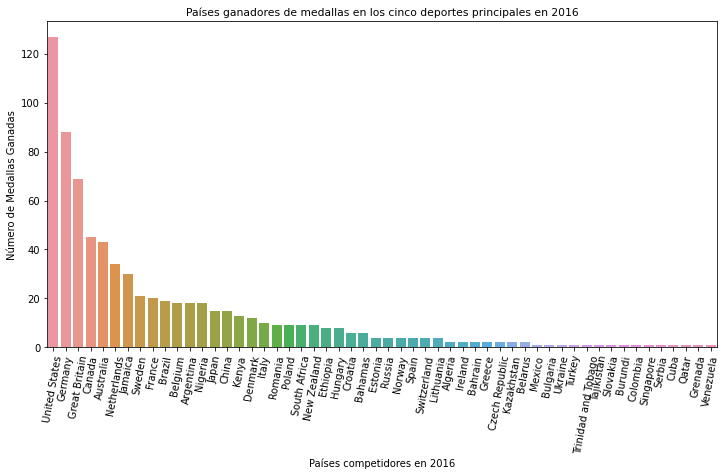

In [11]:
fig, ax1 = plt.subplots(figsize=(12,6))
plt.rcParams.update({'font.size': 9})

sns.barplot(data = team_medal, x="Team", y="Medal")
ax1.set_xlabel('Países competidores en 2016')
ax1.set_ylabel('Número de Medallas Ganadas')
ax1.set_title("Países ganadores de medallas en los cinco deportes principales en 2016")
plt.xticks(rotation=80)
ax1.tick_params(axis='y')
plt.show()

Como se observa, el país con más medallas ganadas en 2016 en los cinco principales deportes es Estados Unidos con 127 medallas, seguido por Alemania con 88, Reino Unido con 69, Canadá con 45 y Australia con 43.

In [12]:
team_medal[team_medal["Team"]=="Colombia"]

,Team,Medal
47,Colombia,1


In [13]:
athlete_df[athlete_df["Team"]== "Colombia"]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
101862,51514,Caterine Ibargn Mena,F,32.0,185.0,70.0,Colombia,COL,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's Triple Jump,Gold


Nuestro país sólo obtuvo una medalla en 2016 para los cinco deportes principales. La medalla fue de oro en atletismo, y la ganó Catherine Ibarguén en Salto Triple.

Por último, revisemos la tendencia del peso medio de los atletas masculinos y femeninos ganadores en los cinco principales deportes en 2016.

In [14]:
#Agrupando por Sexo, y luego calculando el promedio del peso medio 
weight_df = athlete_df.groupby(["Sex"])["Weight"].mean().sort_values(ascending = False)
weight_df = pd.DataFrame(data=weight_df).reset_index()
weight_df.head(5)

,Sex,Weight
0,M,81.80914
1,F,65.24507


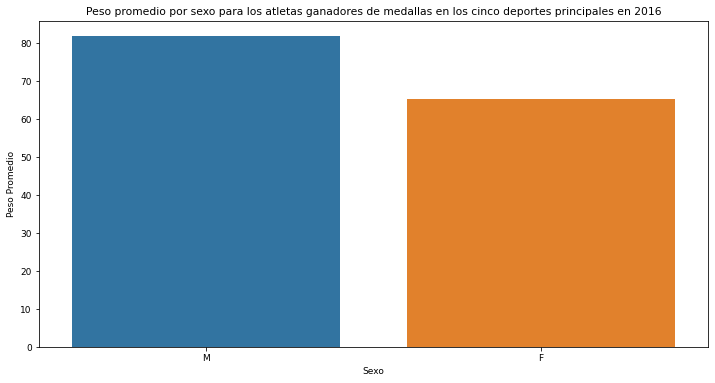

In [15]:
fig, ax1 = plt.subplots(figsize=(12,6))
plt.rcParams.update({'font.size': 9})

sns.barplot(data = weight_df, x="Sex", y="Weight")
ax1.set_xlabel('Sexo')
ax1.set_ylabel('Peso Promedio')
ax1.set_title("Peso promedio por sexo para los atletas ganadores de medallas en los cinco\
 deportes principales en 2016")
ax1.tick_params(axis='y')
plt.show()

Se observa una diferencia entre los pesos promedios de ambos grupos, el peso promedio para los atletas masculinos ganadores de medallas fue de 81.80 kg, mientras que el peso promedio para las atletas femeninos ganadoras de medallas fue de 65.23kg.

Miremos si esta tendencia se conserva en los diferentes deportes mencionados anteriormente:

In [16]:
#Agrupando por Deporte y Sexo, y luego calculando el promedio del peso medio 
weight_team_df = athlete_df.groupby(["Sport","Sex"])["Weight"].mean().sort_values(ascending = False)
weight_team_df = pd.DataFrame(data=weight_team_df).reset_index()
weight_team_df.head(10)

,Sport,Sex,Weight
0,Rowing,M,88.833333
1,Swimming,M,83.408602
2,Athletics,M,79.074468
3,Hockey,M,78.380000
4,Football,M,75.725490
5,Rowing,F,71.766667
6,Swimming,F,66.195876
7,Hockey,F,63.061224
8,Football,F,62.962963
9,Athletics,F,62.578947


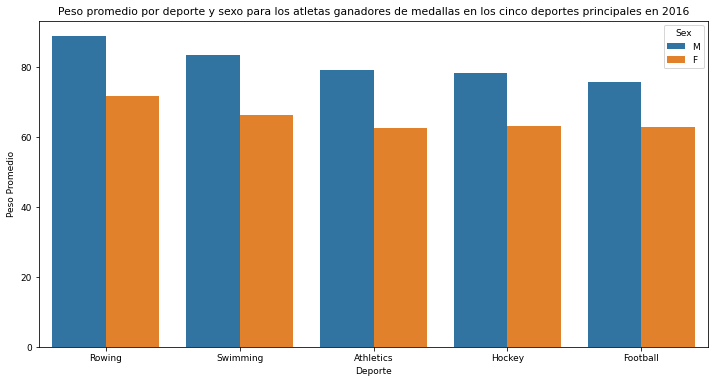

In [17]:
fig, ax1 = plt.subplots(figsize=(12,6))
plt.rcParams.update({'font.size': 9})

sns.barplot(data = weight_team_df, x="Sport", y="Weight", hue="Sex")
ax1.set_xlabel('Deporte')
ax1.set_ylabel('Peso Promedio')
ax1.set_title("Peso promedio por deporte y sexo para los atletas ganadores de medallas en los cinco\
 deportes principales en 2016")
ax1.tick_params(axis='y')
plt.show()

Como se observa, la tendencia general (el peso promedio en general es mayor en los atletas masculinos ganadores de medallas que en las atletas femeninas) se mantiene en cada deporte. 

## Ejercicio 1.2

**Estadísticas:** Seguiremos trabajando con el conjunto de datos de 120 años de historia olímpica adquirido por Randi Griffin en [Randi Griffin](https://www.sports-reference.com/).

Como especialista en visualización, su tarea consiste en crear dos parcelas para los ganadores de medallas de 2016 de cinco deportes: atletismo, natación, remo, fútbol y hockey.

- Crea un gráfico utilizando una técnica de visualización adecuada que presente de la mejor manera posible el patrón global de las características de **height** y **weight** de los ganadores de medallas de 2016 de los cinco deportes.

- Crea un gráfico utilizando una técnica de visualización adecuada que presente de la mejor manera posible la estadística de resumen para la altura y el peso de los jugadores que ganaron cada tipo de medalla (oro/plata/bronce) en los datos.

**Pasos importantes**

- Descargue el conjunto de datos y formatéelo como un **pandas** DataFrame
- Filtrar el DataFrame para incluir únicamente las filas correspondientes a los ganadores de medallas de 2016 en los deportes mencionados en la descripción de la actividad.
- Observe las características del conjunto de datos y anote su tipo de datos: ¿son categóricos o numéricos?
- Evaluar cuál sería la visualización adecuada para que un patrón global represente las características de **height** y **weight**
- Evaluar cuál sería la visualización adecuada para representar las estadísticas resumidas de las características de **height** y **weight** en función de las medallas, separadas además por género de los atletas.

Cargamos entonces los datos nuevamente:

In [18]:
athlete_link = "https://raw.githubusercontent.com/lihkirun/AppliedStatisticMS/main/DataVisualizationRPython/Lectures/Python/PythonDataSets/athlete_events.csv"
athlete_df = pd.read_csv(athlete_link)
athlete_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [19]:
#Filtrando por Ganadores de Medallas y año 2016
best_df = athlete_df[athlete_df.Medal.notna() & (athlete_df.Year == 2016)]

#Filtrando por los deportes con más medallas
best_df = best_df[best_df.Sport.isin(["Athletics","Swimming", "Rowing", "Football", "Hockey"])]
best_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
158,62,Giovanni Abagnale,M,21.0,198.0,90.0,Italy,ITA,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Men's Coxless Pairs,Bronze
814,465,"Matthew ""Matt"" Abood",M,30.0,197.0,92.0,Australia,AUS,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,Bronze
1228,690,Chantal Achterberg,F,31.0,172.0,72.0,Netherlands,NED,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Quadruple Sculls,Silver
1529,846,Valerie Kasanita Adams-Vili (-Price),F,31.0,193.0,120.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's Shot Put,Silver
1847,1017,Nathan Ghar-Jun Adrian,M,27.0,198.0,100.0,United States,USA,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 50 metres Freestyle,Bronze


In [20]:
best_df.describe()

,ID,Age,Height,Weight,Year
count,732.000000,732.000000,729.000000,727.000000,732.0
mean,68648.244536,25.577869,180.023320,73.720770,2016.0
std,39361.251654,4.451373,10.076398,14.279014,0.0
min,62.000000,16.000000,150.000000,40.000000,2016.0
25%,32676.750000,22.000000,173.000000,64.000000,2016.0
50%,73187.000000,25.000000,180.000000,72.000000,2016.0
75%,103225.000000,29.000000,187.000000,82.000000,2016.0
max,135525.000000,40.000000,207.000000,136.000000,2016.0


In [21]:
best_df.dtypes

ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
Team       object
NOC        object
Games      object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
dtype: object

Se tiene entonces que hay diferentes tipos de datos, tenemos datos numéricos como la edad, altura, peso, y el año. Tenemos datos categóricos como el nombre, sexo, y equipo, entre otros. 

Para poder representar el patrón global de las características de altura y peso de los ganadores de medallas de 2016 de los cinco deportes, utilizaremos un diagrama de dispersión hexagonal (hexbin):

<Figure size 720x720 with 0 Axes>

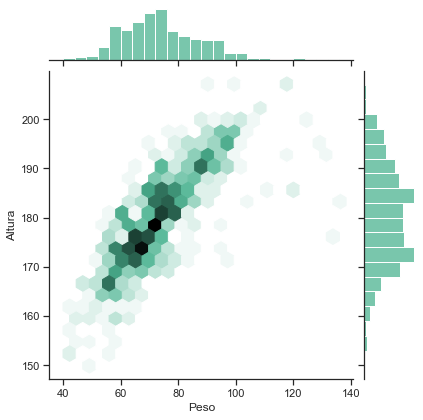

In [22]:
plt.figure(figsize=(10, 10))
plt.rcParams.update({'font.size': 9})

sns.set(style="ticks")
sns.jointplot(x=best_df.Weight, y=best_df.Height, kind="hex", color="#4CB391")

plt.xlabel('Peso')
plt.ylabel('Altura')
plt.show()

Se puede observar que hay una correlación positiva entre la altura y el peso, ya que a medida que la altura va aumentando, el peso también lo hace. También se observa que es una correlación bastante lineal. La mayoría de los atletas se concentran en el área comprendida entre 62 y 84 kgs de peso, y 172 y 187 cms de altura. Esto corresponde aproximadamente con el primer y tercer cuantil de cada variable, es decir, que se observa aproximadamente un 50% de los atletas dentro de esta región.

Para poder visualizar la estadística de resumen para la altura y el peso de los jugadores que ganaron cada tipo de medalla en los datos filtrados separados por género, podemos tener dos posibilidades. La primera, es usar el mismo diagrama de dispersión pero usando la opción de hue para ver como se comportan las dos variables en diferentes grupos.

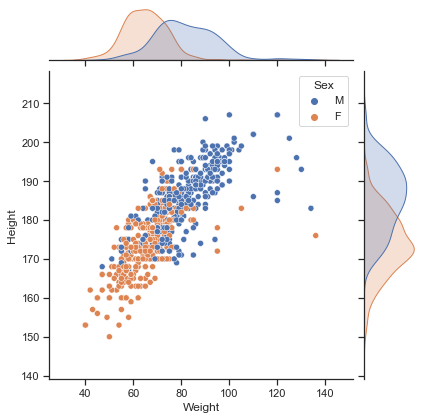

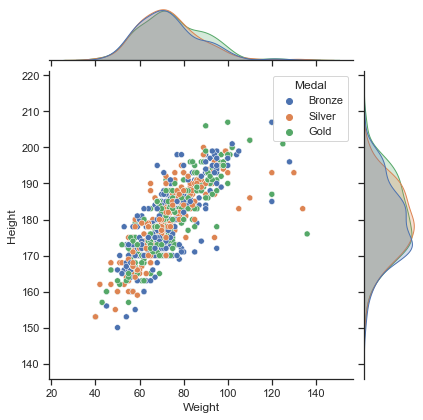

In [23]:
#Gráfico 1, donde se muestra el comportamiento de las variables altura y peso para cada género
sns.jointplot(x=best_df.Weight, y=best_df.Height, color="#4CB391", hue=best_df.Sex)

#Gráfico 2, donde se muestra el comportamiento de las variables altura y peso para cada medalla
sns.jointplot(x=best_df.Weight, y=best_df.Height, color="#4CB391", hue=best_df.Medal)

Se puede observar en el primer gráfico de dispersión la misma correlación positiva entre peso y altura para ambos grupos. Adicionalmente, se observa que para los atletas masculinos los valores de peso y altura tienden a ser mayores que para las atletas femeninas, como se había observado en el punto 1.1. 

En el segundo gráfico, mirando ambas variables por medallas, si bien se mantiene la correlación positiva entre ambas, no hay una diferencia significativa entre los atletas que ganaron medallas de oro, plata o bronce.

Verifiquemos esto con un diagrama de violín:

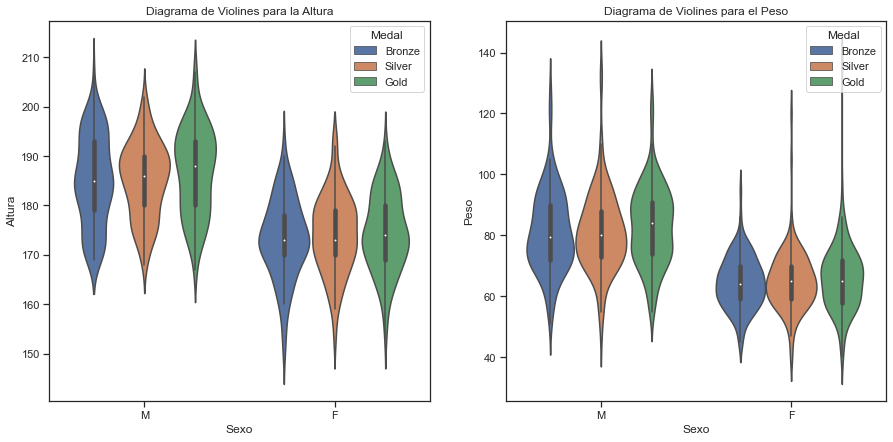

In [24]:
fig, ax=plt.subplots(1,2, figsize=(15,7))

sns.violinplot(x='Sex', y='Height', data=best_df, hue='Medal', ax=ax[0])
ax[0].set_xlabel("Sexo")
ax[0].set_ylabel("Altura")
ax[0].set_title("Diagrama de Violines para la Altura")

sns.violinplot(x='Sex', y='Weight', data=best_df, hue='Medal', ax=ax[1])
ax[1].set_xlabel("Sexo")
ax[1].set_ylabel("Peso")
ax[1].set_title("Diagrama de Violines para el Peso")

plt.show()

Cómo se puede observar en los diagramas de violín, la tendencia general se mantiene, es decir, que en general el peso y altura promedio son mayores en los atletas masculinos que las atletas femeninas. Pero no hay una diferencia significativa entre los atletas ganadores de las diferentes medallas (oro, plata y bronce).

## Ejercicio 1.3

En esta actividad, utilizaremos los archivos `co2.csv` y `gapminder.csv`. El primero consiste en las emisiones de dióxido de carbono por persona por año y por país, mientras que el segundo consiste en el PIB por año y por país. Es importante que se prueben varios tipos de visualización para para determinar la visualización que mejor transmite el mensaje que está tratando de dar con sus datos. Vamos a crear algunas visualizaciones interactivas utilizando la biblioteca **`Plotly Express`** para determinar cuál es la que mejor se adapta a nuestros datos.

1. Vuelve a crear el **DataFrame** de las emisiones de dióxido de carbono y del PIB.
2. Crea un gráfico de dispersión con los ejes **x** e **y** como **year** y **co2** respectivamente. Añada un histograma para los valores de **co2** con el parámetro **marginaly_y**.
3. Crea un gráfico de caja para los valores del PIB con el parámetro **marginal_x**. Añada los parámetros de parámetros de animación en la columna del año.
4. Crea un gráfico de dispersión con los ejes **x** e **y** como **gdp** y **co2** respectivamente.
5. Cree un contorno de densidad con los ejes **x** e **y** como **gdp** y **co2** respectivamente.

Se cargan los datos de las emisiones de dióxido de carbono y del PIB.

In [2]:
url_co2 = 'https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/co2.csv'
co2 = pd.read_csv(url_co2)
co2.head()

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0529,0.0637,0.0854,0.154,0.242,0.294,0.412,0.35,0.316,0.299
1,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.3800,1.2800,1.3000,1.460,1.480,1.560,1.790,1.68,1.730,1.960
2,Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.2200,2.9900,3.1900,3.160,3.420,3.300,3.290,3.46,3.510,3.720
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7.3000,6.7500,6.5200,6.430,6.120,6.120,5.870,5.92,5.900,5.830
4,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.9800,1.1000,1.2000,1.180,1.230,1.240,1.250,1.33,1.250,1.290


In [3]:
url_gm = 'https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/gapminder.csv'
gm = pd.read_csv(url_gm)
gm.head()

,Country,Year,fertility,life,population,child_mortality,gdp,region
0,Afghanistan,1964,7.671,33.639,10474903.0,339.7,1182.0,South Asia
1,Afghanistan,1965,7.671,34.152,10697983.0,334.1,1182.0,South Asia
2,Afghanistan,1966,7.671,34.662,10927724.0,328.7,1168.0,South Asia
3,Afghanistan,1967,7.671,35.170,11163656.0,323.3,1173.0,South Asia
4,Afghanistan,1968,7.671,35.674,11411022.0,318.1,1187.0,South Asia


Se realiza la misma transformación hecha en clase para tener todos los datos agregados en una misma tabla:

In [4]:
df_gm = gm[['Country', 'region']].drop_duplicates()
df_w_regions = pd.merge(co2, df_gm, left_on='country', right_on='Country', how='inner')
df_w_regions = df_w_regions.drop('Country', axis='columns')

new_co2 = pd.melt(df_w_regions, id_vars=['country', 'region'])
columns = ['country', 'region', 'year', 'co2']
new_co2.columns = columns
df_co2 = new_co2[new_co2['year'].astype('int64') > 1963]
df_co2 = df_co2.sort_values(by=['country', 'year'])
df_co2['year'] = df_co2['year'].astype('int64')

df_gdp = gm[['Country', 'Year', 'gdp']]
df_gdp.columns = ['country', 'year', 'gdp']

data = pd.merge(df_co2, df_gdp, on=['country', 'year'], how='left')
data = data.dropna()

data.head()

,country,region,year,co2,gdp
0,Afghanistan,South Asia,1964,0.0863,1182.0
1,Afghanistan,South Asia,1965,0.1010,1182.0
2,Afghanistan,South Asia,1966,0.1080,1168.0
3,Afghanistan,South Asia,1967,0.1240,1173.0
4,Afghanistan,South Asia,1968,0.1160,1187.0


Generemos un gráfico de dispersión con los ejes **x** e **y** como **year** y **co2** respectivamente. Para observar de mejor manera las tendencias, primero agregaremos los datos por región.

In [5]:
#Primero, realizamos un groupby con la region y año, para sumar el co2 por región
co2_gdp_agg = data.groupby(["region","year"])["co2","gdp"].sum().reset_index()
co2_gdp_agg.head()

/var/folders/w2/j_r2nxj526x02wjfw52mqty1h_5b0_/T/ipykernel_22911/3558987074.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,region,year,co2,gdp
0,America,1964,72.5808,201994.0
1,America,1965,78.6383,209493.0
2,America,1966,80.8358,215762.0
3,America,1967,92.2406,221346.0
4,America,1968,99.7462,227227.0


In [6]:
fig = px.scatter(co2_gdp_agg, x="year", y="co2", marginal_y="histogram", color="region")
fig.show()

Se observa que en regiones como Europa y Asia Central, y Oriente Medio y el Norte de África, si bien la tendencia de las emisiones de dióxido de carbono por persona era alcista entre 1970 y 1980, luego tuvo una estabilización (en el caso de Europa y Asia Central), y una bajada en el caso de Oriente Medio y el Norte de África. En los últimos años, ambas regiones registraron tendencias a la baja.

El resto de regiones, si bien, algunas han tenido cambios en las tendencias entre 1970 y 1980, como es el caso de América y APAC, en general, han venido subiendo las emisiones constantemente desde 1980, en una tendencia alcista.

Observemos ahora el cambio de la distribución del PIB a través de los años para los países:

In [7]:
fig = px.box(data, x="gdp", animation_frame="year", hover_data=["country","gdp"])
fig.show()

In [31]:
#Para generar la visualización a tráves de los años
px_off_plot(fig)

'temp-plot.html'

A través de la animación, se puede observar el cambio en la distribución del PIB a lo largo de los años. En general, se observa un crecimiento sostenido, con bajadas en algunos años debido a algunas crisis económicas. Esto se puede observar por ejemplo, en los años de 1982 - 1984 (crisis del petróleo en Medio Oriente), en los años de 1990 a 1992 (caída de la Unión Soviética), y en los años 2008 a 2009 (Crisis Subprime en USA). 

Generemos ahora un gráfico de dispersión con los ejes **x** e **y** como **gdp** y **co2** respectivamente.

In [8]:
fig = px.scatter(data, x="gdp", y="co2")
fig.show()

Como se observa en el gráfico de dispersión, hay una tendencia clara entre la cantidad de emisiones de CO2 emitidas y el PIB de un país, en general se observa un correlación positiva. A mayor PIB, mayores emisiones de CO2. 

Observemos ahora el mismo gráfico, pero agregado por regiones:

In [9]:
fig = px.scatter(co2_gdp_agg, x="gdp", y="co2", color="region", hover_data=["year"])
fig.show()

Cómo se observa, la misma tendencia se mantiene para la mayoría de regiones, aunque para la región de Europa y Asia Central, hay una especie de estabilización, cuando la economía alcanza cierto nivel de PIB, no necesariamente emite más CO2.

Por último, generemos un contorno de densidad para las mismas variables:

In [10]:
fig = px.density_contour(data, x="gdp", y="co2", range_x=[-2000,10000], range_y=[-2, 4])
fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.show()

Se observa en el gráfico que la mayoría de contornos están en la esquina inferior izquierda del gráfico, que representa los países con bajo PIB y bajas emisiones de CO2. Haciendo zoom en la gráfica, se observan seis contornos.

## Ejercicio 1.4
Trabajaremos con el conjunto de datos de Google Play Store Apps alojado en googleplaystore.csv. Su tarea es crear una visualización con:
- Un gráfico de barras de un número de aplicaciones estratificado por cada categoría Content Rating (calificado por Everyone/Teen).
- Un mapa de calor que indica el número de aplicaciones estratificadas por app Category y rangos de rangos segmentados por Rating. El usuario debe poder interactuar con el gráfico seleccionando cualquiera de los tipos de Content Rating y el cambio correspondiente debería reflejarse en el mapa de calor para incluir sólo el número de aplicaciones en la categoría Content Rating.

Pasos principales
- Descargue el conjunto de datos [googleplaystore.csv](https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/googleplaystore.csv) y formatéelo como un `pandas` `DataFrame`
- Elimina las entradas del `DataFrame` que tienen valores de característica de `NA`.
- Cree el gráfico de barras necesario del número de aplicaciones en cada categoría **Content Rating**
- Cree el mapa de calor necesario indicando el número de aplicaciones en la app en rangos **Category** y **Rating**
- Combine el código del gráfico de barras y del mapa de calor y cree una visualización con ambos gráficos vinculados dinámicamente entre sí.
- Interprete cada visualización

Primero importamos el archivo de datos que contiene el detalle de aplicaciones de Google Play Store.

In [ ]:
url_app = 'https://raw.githubusercontent.com/lihkirun/AppliedStatisticMS/main/DataVisualizationRPython/Lectures/Python/PythonDataSets/googleplaystore.csv'
apps = pd.read_csv(url_app, sep=',')
print(apps.shape)
apps.head()

(10841, 13)


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


Al verificar qué columnas tienen valores de características NA, encontramos que rating, type, content rating, current version y android version.

In [ ]:
apps.isna().sum(axis=0)

App                  0
Category             0
Rating            1474
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content Rating       1
Genres               0
Last Updated         0
Current Ver          8
Android Ver          3
dtype: int64

Procedemos entonces a eliminar dichas entradas:

In [ ]:
apps=apps.dropna()
apps.reset_index(drop=True, inplace=True)
apps.isna().sum(axis=0)
print(apps.shape)
apps.head()

(9360, 13)


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


Por Content Rating, podemos ver que el mayor número de aplicaciones corresponde a la categoría Everyone, seguido de Teen. Las categorias Everyone 10+ y Mature 17+ tienen número de aplicaciones muy cercanas y no hay aplicaciones en las categorías Adults only 18+ y Unrated.

In [ ]:
alt.Chart(apps).mark_bar().encode(
    x = 'Content Rating:N',
    y = 'count():Q'
).properties(width=400).interactive()

alt.Chart(...)

Al revisar el número de aplicaciones estratificadas por Category y Rating, vemos que el mayor número se encuentra en la categoría de familia y rating de 4.0 con una cantidad superior a 600.

In [ ]:
heatmap = alt.Chart(apps).mark_rect().encode(
    alt.Y('Rating:Q', bin = True),
    alt.X('Category:N'),
    alt.Color('count():Q', scale = alt.Scale(scheme='greenblue'), legend = alt.Legend(title='Total Apps'))
)

circles = heatmap.mark_point().encode(
    alt.ColorValue('grey'),
    alt.Size('count()', legend = alt.Legend(title='Records in Selection'))
)

heatmap + circles


alt.LayerChart(...)

Se puede observar que las categorías de las apps en el Google PlayStore con más rating son Familia, en donde se observan al menos 800 apps con un rating entre 4.0 y 4.5, y 600 apps con rating entre 4.5 y 5.

El segundo lugar es para la categoría de Juegos, con al menos 600 apps con rating entre 4.0 y 4.5, y 400 apps con rating entre 4.5 y 5.

El tercer lugar se lo lleva la categoría de herramientas ("Tools"), con 400 apps con rating entre 4.0 y 4.5.

Realicemos el mismo heatmap, pero teniendo en cosideración el Content Rating:

In [ ]:
selected_region = alt.selection(type="single", encodings=['x'])

heatmap = alt.Chart(apps).mark_rect().encode(
    alt.Y('Rating:Q', bin = True),
    alt.X('Category:N'),
    alt.Color('count()', scale = alt.Scale(scheme = 'greenblue'), legend = alt.Legend(title = 'Total Apps'))
).properties(
    width=600
)

circles = heatmap.mark_point().encode(
    alt.ColorValue('grey'),
    alt.Size('count()', legend = alt.Legend(title='Records in Selection'))
).transform_filter(
    selected_region
)

bars = alt.Chart(apps).mark_bar().encode(
    x = 'Content Rating:N',
    y = 'count():Q',
    color = alt.condition(selected_region, alt.ColorValue("steelblue"), alt.ColorValue("grey"))
).properties(
    width=600
).add_selection(selected_region)

heatmap + circles | bars

alt.HConcatChart(...)

Al hacer clic en cada gráfico de barras, el mapa de calor se actualiza con la información de las descargas por categoría y rango correspondientes al Content Rating Seleccionado.

Si miramos el Content Rating de "Everyone", más o menos se mantienen las mismas relaciones encontradas en el heatmap general, siendo la primera categoría Familia, seguida de Juegos y Herramientas.

En cambio, al seleccionar "Mature 17+", se observa que los records seleccionados cambian, siendo la categoría principal las apps de citas, seguidas de las apps de compras.